In [93]:
import numpy as np
import os
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from collections import defaultdict

# write here the path to the arrrays
DATA_DIR = r"../../data/carseg_data/arrays"
DATA_DIR_CORRECTED = r"../../data/carseg_data_corrected/carseg_data/arrays"

colors_info = {
    0: (0, 0, 0),  # background to black
    10: (250, 149, 10),  # orange
    20: (19, 98, 19),  # dark green
    30: (249, 249, 10),  # yellow
    40: (10, 248, 250),  # cyan
    50: (149, 7, 149),  # purple
    60: (5, 249, 9),  # light green
    70: (20, 19, 249),  # blue
    80: (249, 9, 250),  # pink
    90: "white",  # no color (NA)
}
class_descriptions = {
    0: "background",
    10: "hood",
    20: "front door",
    30: "rear door",
    40: "frame",
    50: "rear quater panel",
    60: "trunk lid",
    70: "fender",
    80: "bumper",
    90: "rest of car",
}

keys_to_check = [10, 20, 30, 40, 50, 60, 70, 80]
colors_info = {
    key: value
    if isinstance(value, str)
    else (value[0] / 255, value[1] / 255, value[2] / 255)
    for key, value in colors_info.items()
}
carseg_cmap = ListedColormap(colors_info.values(), name="custom_cmap")


def fetch_images(data_dir, image_name, batch_size):
    """Fetchs the images from data_dir if they start with the image_name, batch size
    specifies how many images to fetch at a time.

    Args:
        data_dir (str): path to the data directory
        image_name (str): image name to fetch 
        batch_size (int): how many images to fetch a at time

    Yields:
        zip: (image_names, image_data, mask_data) a zip containing the names, image data (rgb) and mask
    """
    orange_3_doors_files = [
        filename
        for filename in os.listdir(data_dir)
        if filename.startswith(image_name) and filename.endswith(".npy")
    ]
    for i in range(0, len(orange_3_doors_files), batch_size):
        batch_files = orange_3_doors_files[i : i + batch_size]
        batch_images = [
            np.load(os.path.join(data_dir, filename)) for filename in batch_files
        ]
        image_data = [array[:, :, :3] for array in batch_images]
        mask_data = [array[:, :, 3] for array in batch_images]
        yield zip(batch_files, image_data, mask_data)


def count_classes_in_batch(data_dir, image_name, batch_size):
    """Counts the total number of pixels for each class

    Args:
        data_dir (str): path to the data directory
        image_name (str): image name to fetch 
        batch_size (int): how many images to fetch a at time

    Returns:
        dict: a dict containing the class labels as keys and their accumulated counts
    """
    class_counts = defaultdict(int)
    gen = fetch_images(data_dir, image_name, batch_size)
    for batch in gen:
        file_name, _, mask = next(batch, (None, None, None))
        if file_name is not None:
            unique_classes, class_counts_batch = np.unique(mask, return_counts=True)
            for cls, count in zip(unique_classes, class_counts_batch):
                if count > 0:
                    class_counts[int(cls)] += 1
    # filter the background and rest of the car away
    class_counts_filtered = {
        cls: count for cls, count in class_counts.items() if (cls != 0 and cls != 90)
    }
    return class_counts_filtered


def plot_batch_image_and_mask(data_dir, image_name, batch_size):
    """Makes a plot of the image and mask 

    Args:
        data_dir (str): path to the data directory
        image_name (str): image name to fetch 
        batch_size (int): how many images to fetch a at time
    """
    gen = fetch_images(data_dir, image_name, batch_size)
    sqrt_batch_size = int(np.ceil(np.sqrt(batch_size)))
    num_rows = sqrt_batch_size
    num_cols = int(np.ceil((batch_size * 2) / num_rows))

    for batch in gen:
        fig, axes = plt.subplots(num_rows, num_cols, figsize=(50, 30))
        for i, (ax1, ax2) in enumerate(axes.reshape(-1, 2)):
            file_name, image, mask = next(batch, (None, None, None))
            if file_name is not None:
                ax1.imshow(image)
                ax1.set_title(f"{file_name.split('.')[0]}")
                ax1.axis("off")
                ax2.imshow(mask, cmap=carseg_cmap)
                ax2.set_title(f"{file_name.split('.')[0]}")
                ax2.axis("off")
        plt.show()


def plot_the_class_frequency_in_dataset(data_dir, image_name,filter_value=90):
    """Makes a histogram plot of the frequency of the targets in the dataset.

    Args:
        data_dir (str): path to the data directory
        image_name (str): image name to fetch 
        fitler_value (int): the threshold to when an object (class) can be counted as occuring in the mask
    """
    class_counts = defaultdict(int)
    batch_size = 1
    gen = fetch_images(data_dir, image_name, batch_size,)
    total_number_of_images = 0
    for batch in gen:
        file_name, _, mask = next(batch, (None, None, None))
        if file_name is not None:
            unique_classes, class_counts_batch = np.unique(mask, return_counts=True)
            # normalizing
            class_counts_batch =  np.where(class_counts_batch > filter_value, class_counts_batch / class_counts_batch, 0)
            for cls, count in zip(unique_classes, class_counts_batch):
                class_counts[int(cls)] += count
            total_number_of_images += 1
    # filter the background and rest of the car away
    class_counts = {
        cls: count for cls, count in class_counts.items() if (cls != 0 and cls != 90)
    }
    for key in keys_to_check:
        if key not in class_counts:
            class_counts[key] = 0.1
    class_counts = dict(sorted(class_counts.items()))
    class_counts_percentage = {
        cls: (count / total_number_of_images) * 100
        for cls, count in class_counts.items()
    }
    class_colors_wo_background = [carseg_cmap(i + 1) for i in range(8)]
    # Plotting the histogram
    plt.figure(figsize=(10, 6))
    plt.bar(
        class_counts.keys(),
        class_counts_percentage.values(),
        color=class_colors_wo_background,
        alpha=0.7,
    )
    plt.xlabel("Classes")
    plt.ylabel("Occuring frequency in the dataset in %")
    plt.title(f"Occuring frequency for each class in {image_name} dataset")
    plt.xticks(
        list(class_counts.keys()),
        [class_descriptions.get(cls, str(cls)) for cls in class_counts.keys()],
        rotation=45,
    )
    plt.grid(axis="y")
    plt.show()

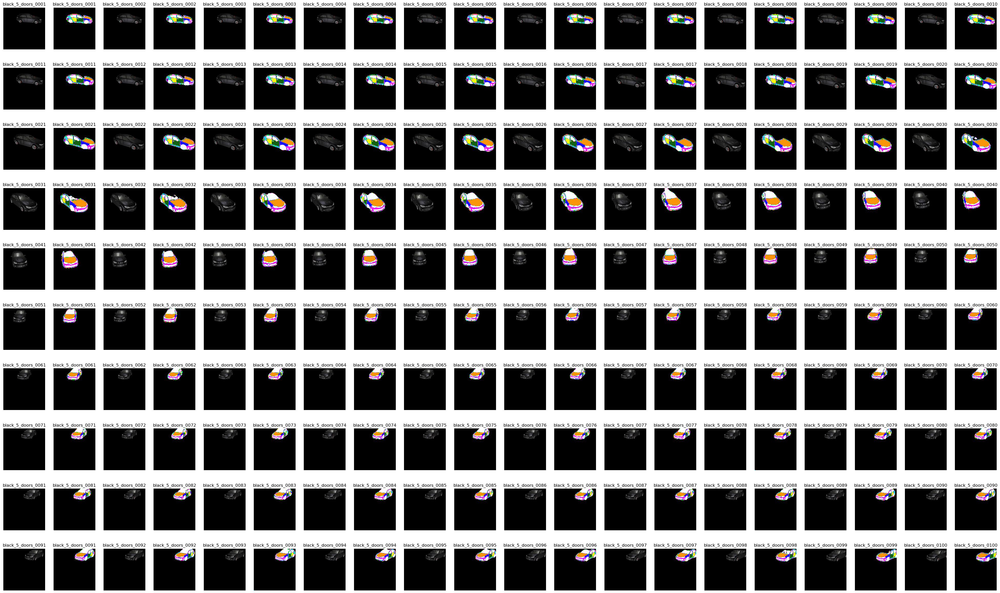

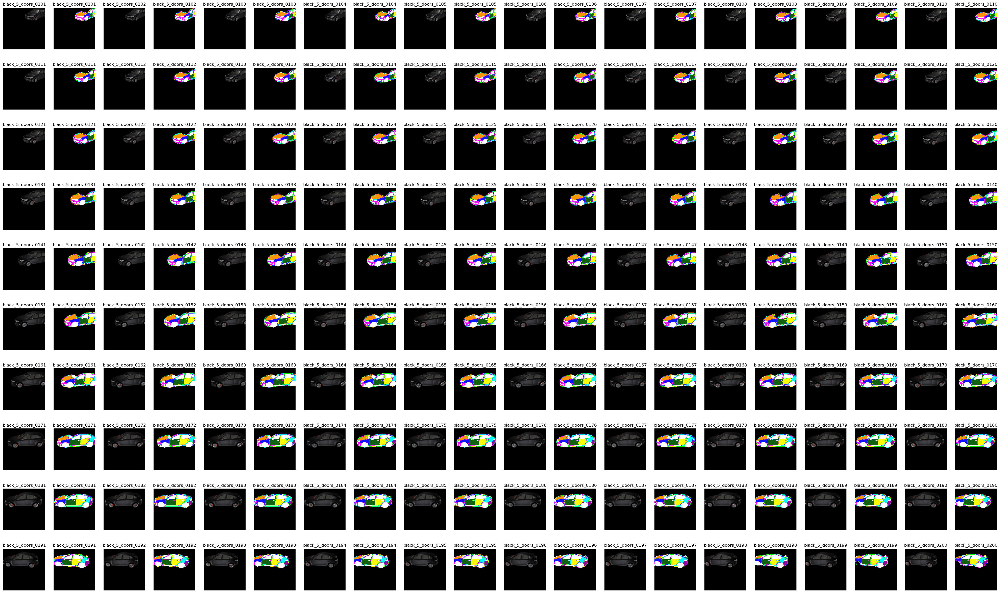

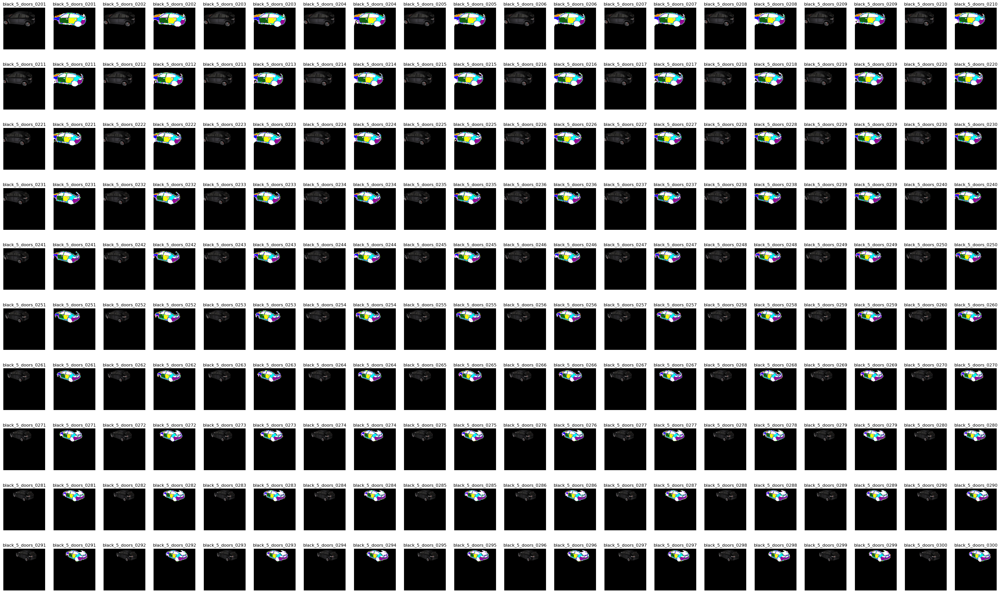

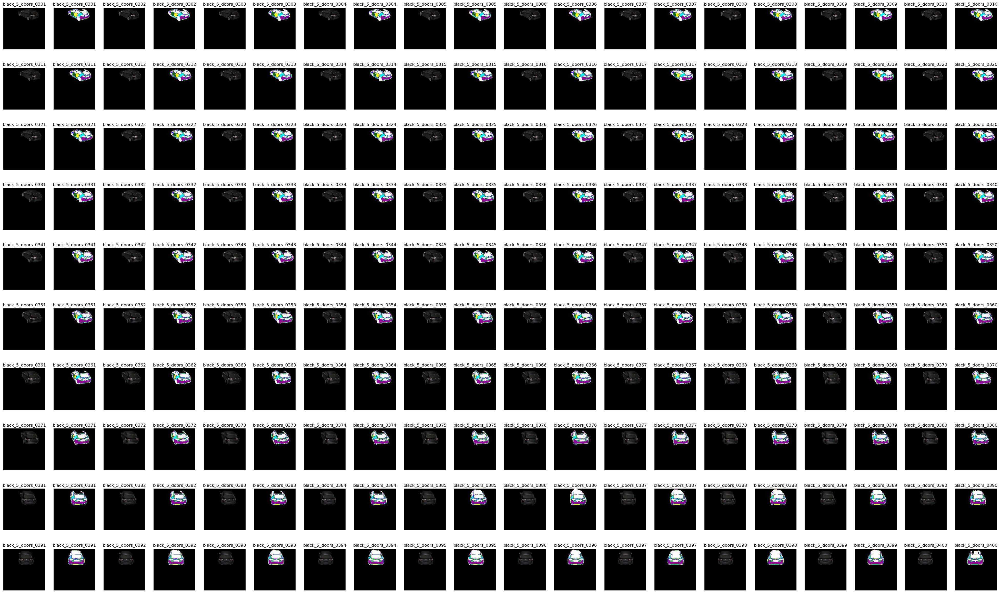

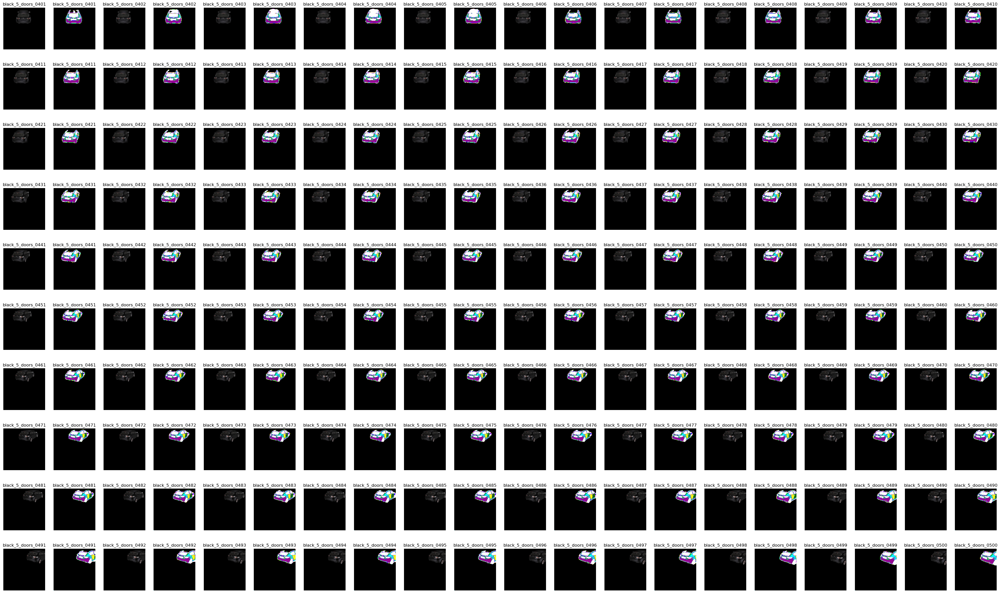

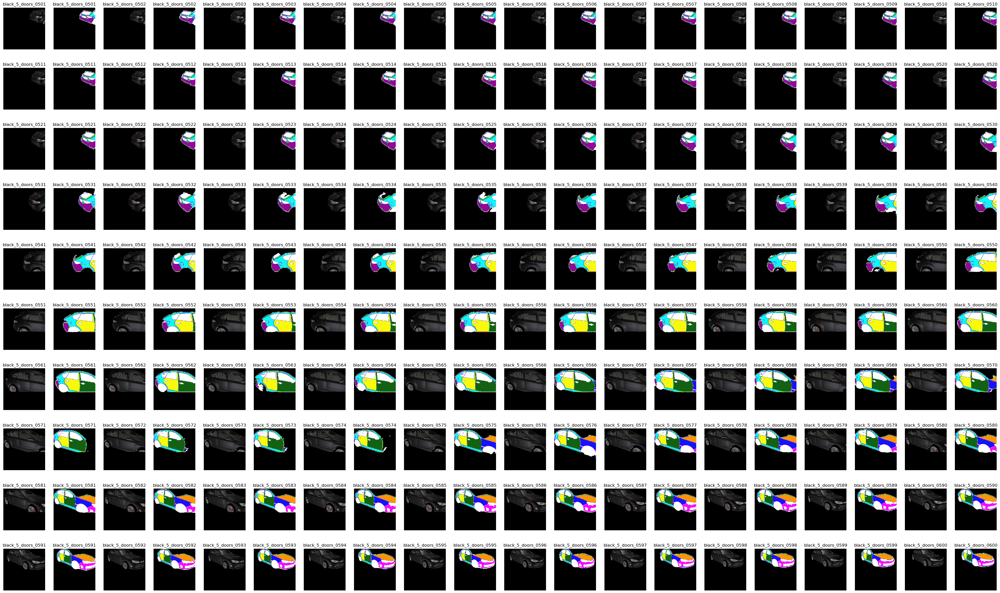

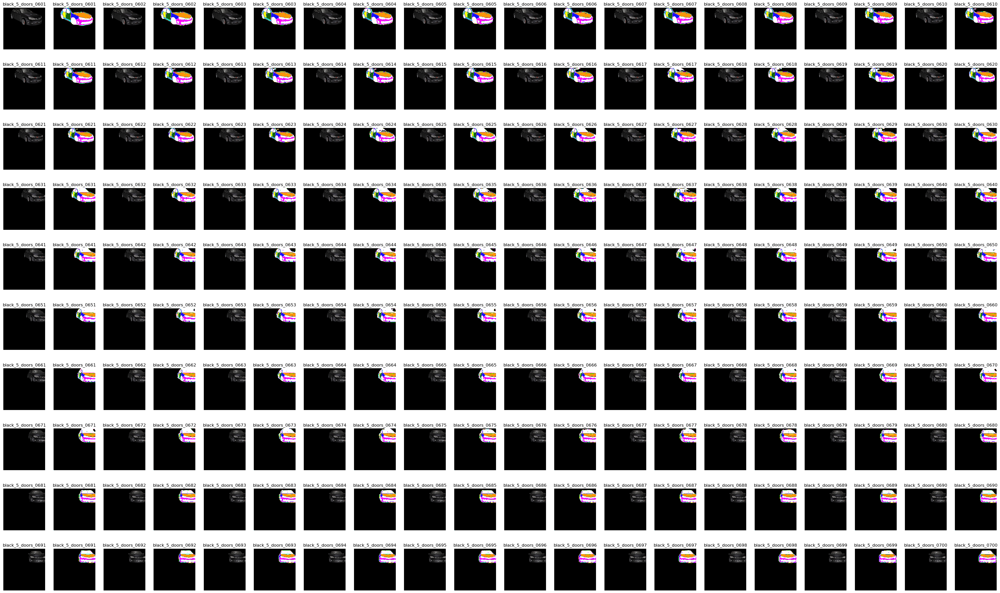

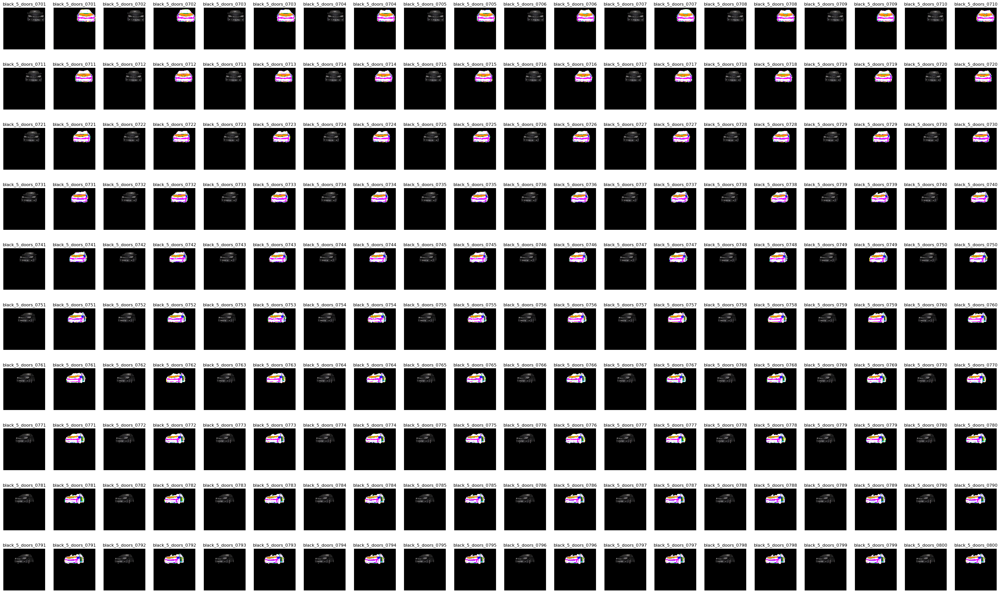

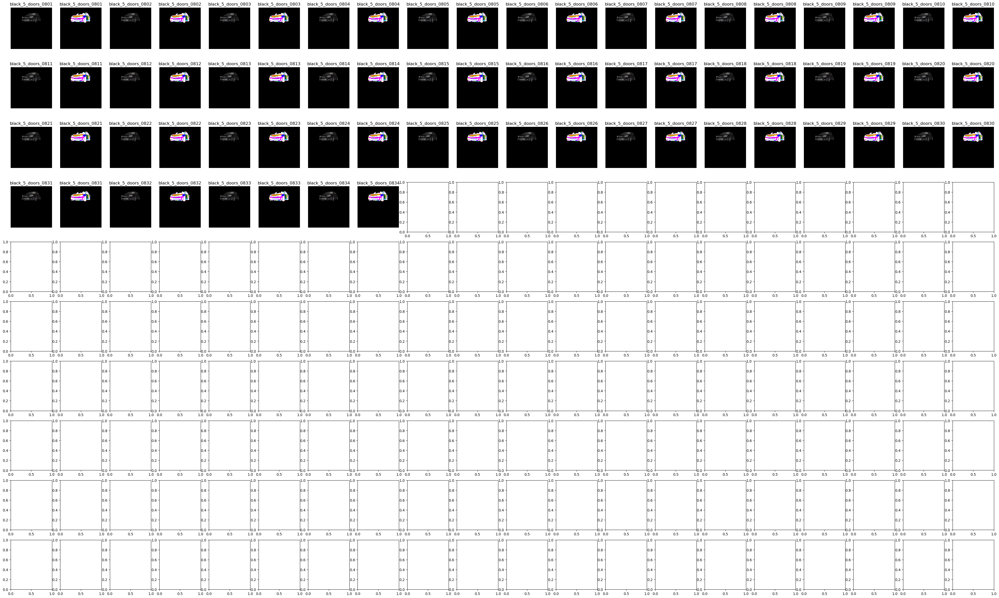

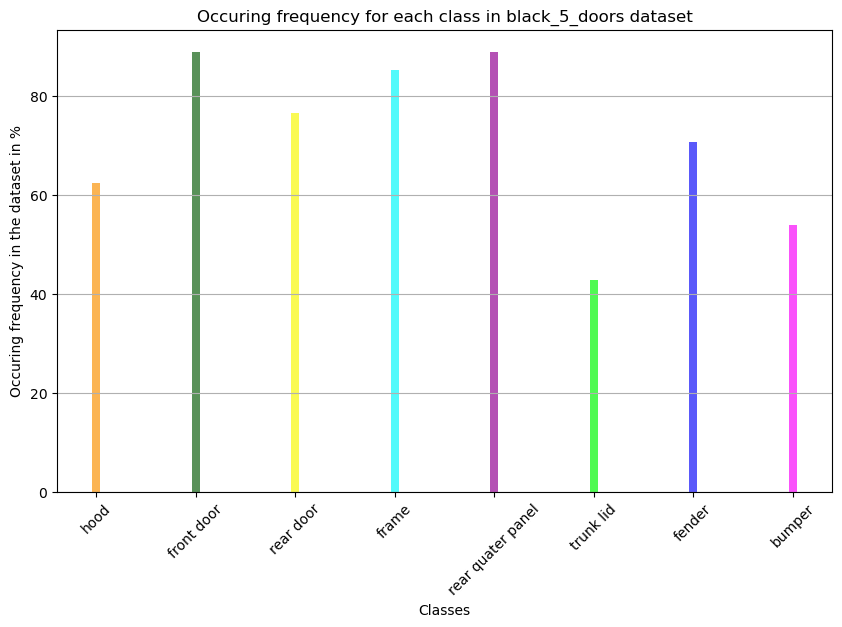

In [94]:
batch_size = 100
image_name = "black_5_doors"

plot_batch_image_and_mask(DATA_DIR_CORRECTED,image_name,batch_size)
plot_the_class_frequency_in_dataset(DATA_DIR_CORRECTED,image_name)
